In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from weak_coupling_ctqmc.bethe_lattice import bethe_green_function
from weak_coupling_ctqmc.mesh import Meshiw, Meshitau
from weak_coupling_ctqmc.green_function import (
    Giw,
    make_Gtau_from_Giw,
    giw_to_gtau_single,
)
from weak_coupling_ctqmc.wc_ctqmc import *
import time

In [2]:
# パラメータの設定
W = 1.0  # 帯域幅
D_0 = 1.0 / np.pi  # 正規化定数 (D_0 = 2/π を仮定)
delta = 0.00  # 正の無限小量
beta = 10  # 逆温度
U = 5  # 相互作用

# マツバラ周波数の定義
meshiw = Meshiw(beta, 1000)

# グリーン関数の計算
giw_values = np.array(
    [bethe_green_function(1.0j * omega, W, D_0, delta) for omega in meshiw.iw]
)
# giw_values = 1 / (1 / giw_values - U)
giw_values = 1 / (1 / giw_values)
giw = Giw(meshiw, giw_values)

In [3]:
# g0, U, beta, and other functions (giw_to_gtau_single, build_M_inv, attempt_vertex_update)
# are assumed to be defined already.

g0 = lambda tau: giw_to_gtau_single(giw, tau) - U / 2

# C_up = []
# C_dn = []
# C = {"u": C_up, "d": C_dn}
C = []
M_up = np.linalg.inv(build_M_inv(C, 1, g0, beta))
M_dn = np.linalg.inv(build_M_inv(C, -1, g0, beta))
M = {"u": M_up, "d": M_dn}
print(C)
print(M)

[]
{'u': array([[1.+0.j]]), 'd': array([[1.+0.j]])}


In [4]:
ntau_bins = 1000
n_steps = 100000
thermalization_steps = 10000
measure_every = 10


S_accum_up = np.zeros(ntau_bins)
S_accum_dn = np.zeros(ntau_bins)
count = 0


for step in range(n_steps):
    C, M = attempt_vertex_update(C, M, g0, U, beta, delta)

    if step > thermalization_steps and step % measure_every == 0:
        S_accum_up += measure_green_function(C, M["u"], g0, beta, ntau_bins)
        S_accum_dn += measure_green_function(C, M["d"], g0, beta, ntau_bins)
        count += 1

[DEBUG] A_insert (raw): (9.608288570030593-5.962858281166416e-15j)  Re: 9.608288570030593, Im: -5.962858281166416e-15
[DEBUG] A_insert (raw): (5.358285447452145-2.1861508582892045e-15j)  Re: 5.358285447452145, Im: -2.1861508582892045e-15
[DEBUG] A_remove (raw): (0.23263235632368162+1.2117351023197556e-16j)  Re: 0.23263235632368162, Im: 1.2117351023197556e-16
[DEBUG] A_remove (raw): (0.25374476344235763+1.574177239029743e-16j)  Re: 0.25374476344235763, Im: 1.574177239029743e-16
[DEBUG] A_insert (raw): (5.669809118203642-2.8354437928447274e-15j)  Re: 5.669809118203642, Im: -2.8354437928447274e-15
[DEBUG] A_insert (raw): (-0.3370019065365311-8.503132806580286e-16j)  Re: -0.3370019065365311, Im: -8.503132806580286e-16
[DEBUG] A_insert (raw): (-2.192663286584998-1.4518507333932392e-15j)  Re: -2.192663286584998, Im: -1.4518507333932392e-15
[DEBUG] A_remove (raw): (0.3006568364322221+8.098761111872859e-17j)  Re: 0.3006568364322221, Im: 8.098761111872859e-17
[DEBUG] A_insert (raw): (1.63268956

In [5]:
# 平均を取る
S_avg_up = S_accum_up / count
S_avg_dn = S_accum_dn / count

G_up = reconstruct_Gtau(g0, S_avg_up, beta, ntau_bins)
G_dn = reconstruct_Gtau(g0, S_avg_dn, beta, ntau_bins)

/home/yamamoto/physics/weak-coupling-ctqmc/python/weak_coupling_ctqmc/wc_ctqmc.py:174: ComplexWarning: Casting complex values to real discards the imaginary part
  Gtau[i] = G0_tau - conv


/home/yamamoto/physics/weak-coupling-ctqmc-work/.venv/lib/python3.10/site-packages/matplotlib/cbook.py:1719: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/yamamoto/physics/weak-coupling-ctqmc-work/.venv/lib/python3.10/site-packages/matplotlib/cbook.py:1355: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


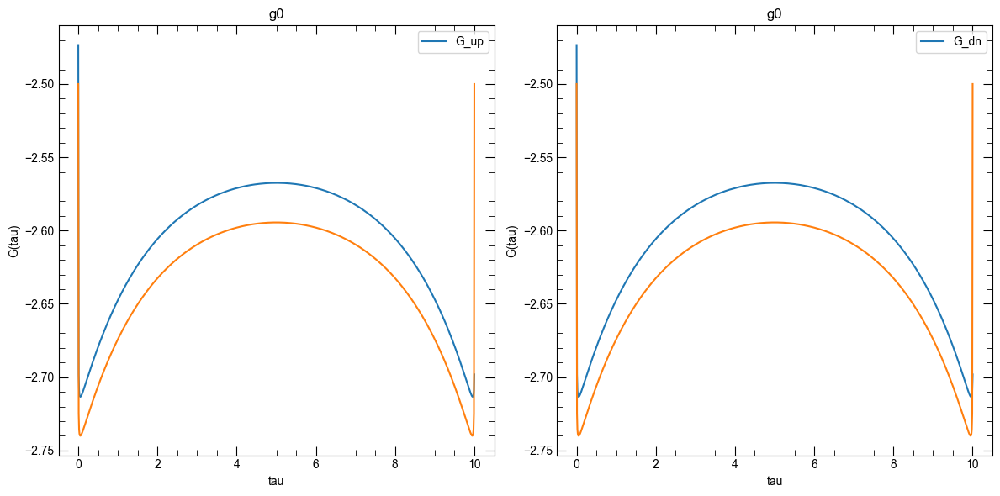

In [ ]:
taus = np.linspace(0, beta, ntau_bins)
g0_org = lambda tau: giw_to_gtau_single(giw, tau) - U / 2

g0_values = np.array([g0_org(tau) for tau in taus])
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].plot(taus, G_up, label="G_up")
ax[0].plot(taus, g0_values, label="g0")
ax[0].set_title("G_up")
ax[0].set_xlabel("tau")
ax[0].set_ylabel("G(tau)")
ax[0].legend()
ax[0].set_title("g0")

ax[1].plot(taus, G_dn, label="G_dn")
ax[1].plot(taus, g0_values, label="g0")
ax[1].set_title("G_dn")
ax[1].set_xlabel("tau")
ax[1].set_ylabel("G(tau)")
ax[1].legend()
ax[1].set_title("g0")
plt.tight_layout()
plt.show()